In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import glob, os, cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [3]:
# objects = glob.glob('./data/objects_extracted/bicycles/*.png')
objects = glob.glob('./data/objects_extracted/*/*.png')

In [8]:
test = pd.DataFrame(columns=['test1','test2','t3'])
test.test1 = objects
test.head()

,test1,test2,t3
0,./data/objects_extracted/hiccups/21_1_0.png,NaN,NaN
1,./data/objects_extracted/hiccups/31_0_0.png,NaN,NaN
2,./data/objects_extracted/hiccups/22_2_1.png,NaN,NaN
3,./data/objects_extracted/hiccups/21_0_0.png,NaN,NaN
4,./data/objects_extracted/hiccups/22_1_0.png,NaN,NaN


In [9]:
df = pd.DataFrame(objects,columns=['path'])
df['path'].astype(str)

0       ./data/objects_extracted/hiccups/21_1_0.png
1       ./data/objects_extracted/hiccups/31_0_0.png
2       ./data/objects_extracted/hiccups/22_2_1.png
3       ./data/objects_extracted/hiccups/21_0_0.png
4       ./data/objects_extracted/hiccups/22_1_0.png
                           ...                     
490    ./data/objects_extracted/bicycles/60_9_2.png
491    ./data/objects_extracted/bicycles/59_1_3.png
492    ./data/objects_extracted/bicycles/60_5_0.png
493    ./data/objects_extracted/bicycles/60_7_0.png
494    ./data/objects_extracted/bicycles/47_0_3.png
Name: path, Length: 495, dtype: object

In [10]:
df.head()

,path
0,./data/objects_extracted/hiccups/21_1_0.png
1,./data/objects_extracted/hiccups/31_0_0.png
2,./data/objects_extracted/hiccups/22_2_1.png
3,./data/objects_extracted/hiccups/21_0_0.png
4,./data/objects_extracted/hiccups/22_1_0.png


In [11]:
len(df)

495

In [12]:
images = []
images_flat = []

for index, row in df.iterrows():
    img = cv2.imread(row.path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    img = cv2.resize(img, (240,240))
    images.append(img)
    images_flat.append(img.flatten())
    
images = np.array(images)
images_flat = np.array(images_flat)

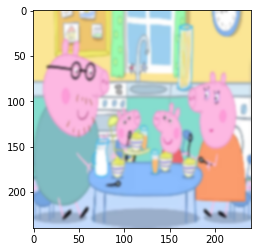

In [13]:
img = images[20]
img = cv2.GaussianBlur(img,(7,7),0)
plt.imshow(img)

## Image Pre-Processesing

#### HOG

In [260]:
from skimage.feature import hog
from skimage import exposure

def pre_process(image_pass):
    # HOG
    fd, hog_image = hog(image_pass, orientations=8, pixels_per_cell=(5, 5),
                        cells_per_block=(2, 2), visualize=True, multichannel=False)

    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 5))

    # SOBEL
    laplacian = cv2.Laplacian(image_pass,cv2.CV_64F)
    sobelx = cv2.Sobel(image_pass,cv2.CV_64F,1,0,ksize=5)
    sobely = cv2.Sobel(image_pass,cv2.CV_64F,0,1,ksize=5)

    return hog_image_rescaled, laplacian, sobelx, sobely

def description(image_pass):
    original = cv2.cvtColor(image_pass, cv2.COLOR_BGR2GRAY)
    img_flip_ver = cv2.flip(original,0)
    img_flip_hor = cv2.flip(original,1)
    img_flip_ver_hor = cv2.flip(img_flip_ver,1)
    list_img = [original,img_flip_ver,img_flip_hor,img_flip_ver_hor]
    features = []
    for img in list_img:
        features.extend(pre_process(img))
    
    return np.array(features)

In [259]:
test = []
f = np.array([pre_process(cv2.cvtColor(images[1], cv2.COLOR_BGR2GRAY))]).flatten()
test.append(f)
test = np.array(test)
test.shape

(1, 230400)

In [209]:
img = cv2.cvtColor(images[1], cv2.COLOR_BGR2GRAY)

In [263]:
imgs_desc = []

for img in images:
    imgs_desc.append(np.array([description(img)]).flatten())

In [265]:
np.array(imgs_desc).shape

(495, 921600)

In [227]:
original = img
img_flip_ver = cv2.flip(original,0)
img_flip_hor = cv2.flip(original,1)
img_flip_ver_hor = cv2.flip(img_flip_ver,1)
list_img = [original,img_flip_ver,img_flip_hor,img_flip_ver_hor]
features = []
for img in list_img:
    features.extend(pre_process(img))
    


In [228]:
np.array(features).shape

(16, 240, 240)

In [205]:
img = cv2.cvtColor(images[1], cv2.COLOR_BGR2GRAY)
test = [description(img)]
test.shape

error: OpenCV(4.5.1) /tmp/pip-req-build-ms668fyv/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-2:Unspecified error) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<3, 4>; VDcn = cv::impl::{anonymous}::Set<1>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


In [188]:
hog, laplace, sobx,soby =  pre_process(img)

In [199]:
img_flip_ver = cv2.flip(img,0)
img_flip_ver_hor = cv2.flip(img_flip_ver,1)
img_flip_hor = cv2.flip(img,1)

(Text(0.5, 1.0, 'Hor'), ([], []), ([], []))

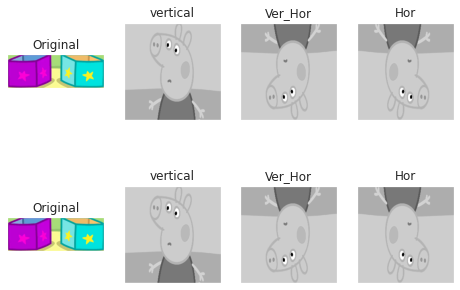

In [375]:
plt.subplot(2,4,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])

plt.subplot(2,4,2),plt.imshow(img_flip_hor,cmap = 'gray')
plt.title('vertical'), plt.xticks([]), plt.yticks([])

plt.subplot(2,4,3),plt.imshow(img_flip_ver_hor,cmap = 'gray')
plt.title('Ver_Hor'), plt.xticks([]), plt.yticks([])

plt.subplot(2,4,4),plt.imshow(img_flip_ver,cmap = 'gray')
plt.title('Hor'), plt.xticks([]), plt.yticks([])

plt.subplot(2,4,5),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])

plt.subplot(2,4,6),plt.imshow(img_flip_hor,cmap = 'gray')
plt.title('vertical'), plt.xticks([]), plt.yticks([])

plt.subplot(2,4,7),plt.imshow(img_flip_ver_hor,cmap = 'gray')
plt.title('Ver_Hor'), plt.xticks([]), plt.yticks([])

plt.subplot(2,4,8),plt.imshow(img_flip_ver,cmap = 'gray')
plt.title('Hor'), plt.xticks([]), plt.yticks([])

## CSV BUILDING

In [14]:
object_ids = []
document_id = []
frames = []
objets_num = []

dict_info = {}
for index, row in df.iterrows():
#     print(os.path.basename(row.path[:-4]).split('_'))

    object_ids.append(os.path.basename(row.path[:-4]))
    info = os.path.basename(row.path[:-4]).split('_')
    
    document_id.append(info[0])
    frames.append(info[1])
    objets_num.append(info[2])

In [15]:
df['id'] = object_ids
df['doc_id'] = document_id
df['frame_id'] = frames
df['object'] = objets_num

In [24]:
test.test2 = object_ids
test.test2 = test.test2.astype(np.str)
test.head()
test.dtypes

test1    object
test2    object
t3       object
dtype: object

In [16]:
df.head()

,path,id,doc_id,frame_id,object
0,./data/objects_extracted/hiccups/21_1_0.png,21_1_0,21,1,0
1,./data/objects_extracted/hiccups/31_0_0.png,31_0_0,31,0,0
2,./data/objects_extracted/hiccups/22_2_1.png,22_2_1,22,2,1
3,./data/objects_extracted/hiccups/21_0_0.png,21_0_0,21,0,0
4,./data/objects_extracted/hiccups/22_1_0.png,22_1_0,22,1,0


In [11]:
objects = df[['id','doc_id', 'frame_id','object', 'path']]

In [12]:
objects.head(10)

,id,doc_id,frame_id,object,path
0,45_0_0,45,0,0,./data/objects_extracted\bicycles\45_0_0.png
1,45_0_1,45,0,1,./data/objects_extracted\bicycles\45_0_1.png
2,45_0_2,45,0,2,./data/objects_extracted\bicycles\45_0_2.png
3,45_1_0,45,1,0,./data/objects_extracted\bicycles\45_1_0.png
4,45_1_1,45,1,1,./data/objects_extracted\bicycles\45_1_1.png
5,45_1_2,45,1,2,./data/objects_extracted\bicycles\45_1_2.png
6,47_0_0,47,0,0,./data/objects_extracted\bicycles\47_0_0.png
7,47_0_1,47,0,1,./data/objects_extracted\bicycles\47_0_1.png
8,47_0_2,47,0,2,./data/objects_extracted\bicycles\47_0_2.png
9,47_0_3,47,0,3,./data/objects_extracted\bicycles\47_0_3.png


### PCA  +  K - Means

In [28]:
# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [18]:
X = np.array(images_flat)

In [19]:
pca = PCA()
pca_images = pca.fit_transform(X)
img_sum_variance = np.cumsum(pca.explained_variance_ratio_)

Text(0.5, 1.0, 'PCA Cumulative variance')

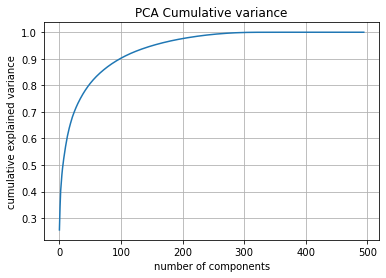

In [20]:
plt.plot(img_sum_variance)
plt.grid()
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('PCA Cumulative variance')

In [276]:
pca = PCA(n_components = 0.98)
pca_images = pca.fit_transform(X)

In [277]:
print("PCA 98% : {}".format(len(pca_images[0])))

PCA 90% : 253


In [20]:
print("flat shape : {} \npca Shape : {}".format(images_flat.shape, pca_images.shape))

flat shape : (495, 57600) 
pca Shape : (495, 202)


### Silouhette , Elbow, coherence pour nombre de cluster K

In [234]:
# X = pca_images
# X = images_flat
# X = np.array(imgs_desc)

In [21]:
print(X.shape)

(495, 172800)


## Elbow

C:\Users\jojim\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


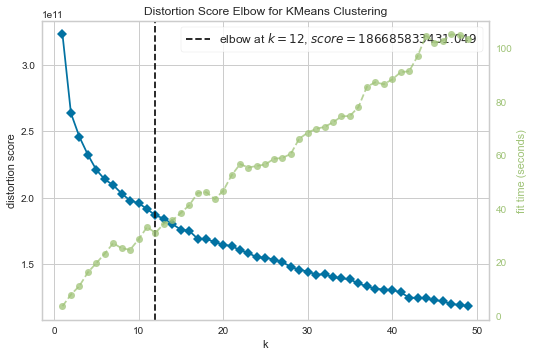

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [23]:
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,50), timings=True)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

## Silhouette 

In [272]:
from sklearn.metrics import silhouette_samples, silhouette_score

Automatically created module for IPython interactive environment


C:\Users\jojim\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

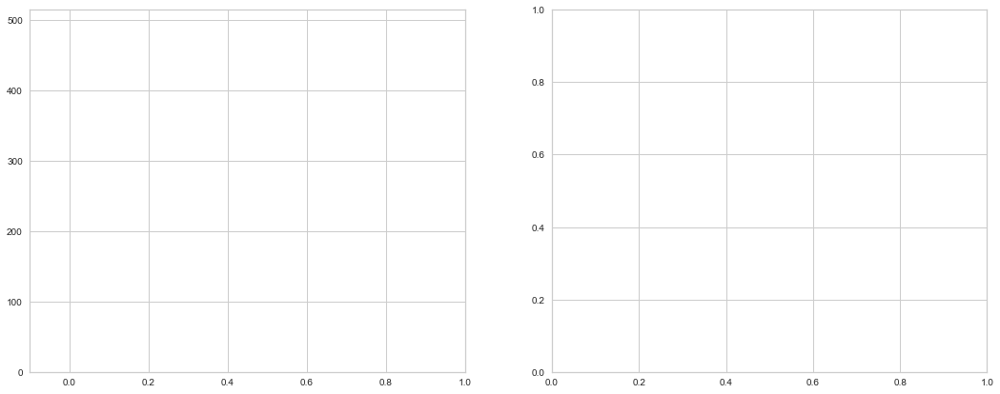

In [25]:
import matplotlib.cm as cm
print(__doc__)

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.

range_n_clusters = [i for i in range(1,50)]
sil_avg = []

for n_clusters in range(1,50):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
#     print("For n_clusters =", n_clusters,
#           "The average silhouette_score is :", silhouette_avg)
    
    sil_avg.append(silhouette_avg)
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    
    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    
    

# plt.show()
plt.scatter(range_n_clusters, silhouette_avg )

In [ ]:
f, ax = plt.subplots(figsize=(20,5))
plt.bar(range_n_clusters[:-1], sil_avg)
plt.xlabel('Silhouette score', fontsize=16)
plt.ylabel('Number of Clusters', fontsize=16)
plt.tick_params(labelsize=20)

## Dendogramme

In [26]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)
    
    
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    return linkage_matrix

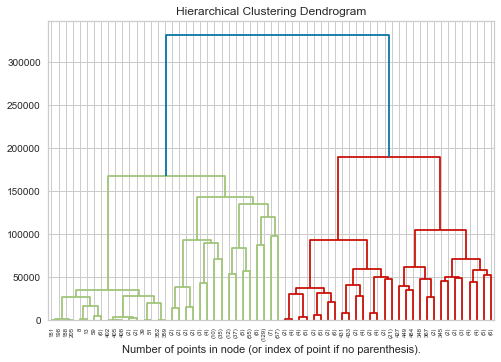

<Figure size 36000x36000 with 0 Axes>

In [32]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=3)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.figure(figsize=(500, 500))
plt.show()

Est-ce que l'axe des y représente la distance entre le centroid du nouveau cluster et lobjet? et Lorsque on place une cluster d'un centroid a distance egale de n points, alors l'axe des y est la distance maximal du point le eloigné, donc ?

In [261]:
plt.figure(figsize=(30, 300))
plt.show()

<Figure size 2160x21600 with 0 Axes>

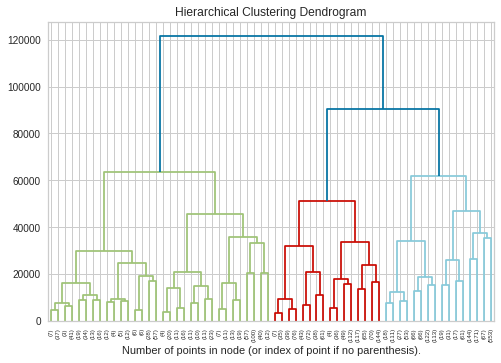

<Figure size 2160x2160 with 0 Axes>

In [293]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(pca_images)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.figure(figsize=(30, 30))
plt.show()

## Building Matrix :  Word - Cluster 

In [29]:
X = images_flat

In [30]:
X.shape

(495, 172800)

In [31]:
nb_clusters = 11

kmeans = KMeans(n_clusters = nb_clusters, n_jobs = -1, random_state = 22)
kmeans.fit(X)

KMeans(n_clusters=11, n_jobs=-1, random_state=22)

In [32]:
objects['cluster'] = kmeans.labels_

In [33]:
print(len(kmeans.labels_))

495


In [34]:
print(len(kmeans.cluster_centers_))

11


In [35]:
from sklearn.metrics import pairwise_distances_argmin_min
closest, _ = pairwise_distances_argmin_min(kmeans.cluster_centers_, X)

In [36]:
closest

array([136, 271, 141, 306, 419,  63,   4, 276,  47,  44, 340], dtype=int64)

In [37]:
centroids = []
for i in range(len(objects)):
    if(i in closest): centroids.append(1)
    else: centroids.append(0)
        
objects['centroid'] = centroids   

In [38]:
objects.head()

,id,doc_id,frame_id,object,path,cluster,centroid
0,45_0_0,45,0,0,./data/objects_extracted\bicycles\45_0_0.png,6,0
1,45_0_1,45,0,1,./data/objects_extracted\bicycles\45_0_1.png,6,0
2,45_0_2,45,0,2,./data/objects_extracted\bicycles\45_0_2.png,2,0
3,45_1_0,45,1,0,./data/objects_extracted\bicycles\45_1_0.png,6,0
4,45_1_1,45,1,1,./data/objects_extracted\bicycles\45_1_1.png,6,1


In [39]:
cl0 = objects.loc[objects['cluster'] == 10]
cl0.head()

,id,doc_id,frame_id,object,path,cluster,centroid
24,54_0_0,54,0,0,./data/objects_extracted\bicycles\54_0_0.png,10,0
27,54_1_0,54,1,0,./data/objects_extracted\bicycles\54_1_0.png,10,0
68,59_7_0,59,7,0,./data/objects_extracted\bicycles\59_7_0.png,10,0
69,59_8_0,59,8,0,./data/objects_extracted\bicycles\59_8_0.png,10,0
85,60_4_0,60,4,0,./data/objects_extracted\bicycles\60_4_0.png,10,0


In [40]:
cl1 = objects.loc[objects['cluster'] == 1]

In [71]:
def plot_cluster(objects, cluster, amount=10):
    cl = objects.loc[objects['cluster'] == cluster][:amount]
    
    images = []
    for index, row in cl.iterrows():
        img = cv2.imread(row.path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)
        
#     plt.close
#     plt.clf()
    f, axarr = plt.subplots(1,amount)
    f.set_size_inches(15, 15)
#     f.suptitle("Cluster #{}".format(cluster))
    for i in range(amount):
        axarr[i].imshow(images[i])
        

In [42]:
def plot_cluster_all(df):
    
    clusters = np.sort(df.cluster.unique())
    
    for cluster in clusters:
        cl = df.loc[df['cluster'] == cluster]
    
    plt.subplot(2,4,1),plt.imshow(img,cmap = 'gray')
    plt.title('Original'), plt.xticks([]), plt.yticks([])

    plt.subplot(2,4,2),plt.imshow(img_flip_hor,cmap = 'gray')
    plt.title('vertical'), plt.xticks([]), plt.yticks([])

    plt.subplot(2,4,3),plt.imshow(img_flip_ver_hor,cmap = 'gray')
    plt.title('Ver_Hor'), plt.xticks([]), plt.yticks([])

    plt.subplot(2,4,4),plt.imshow(img_flip_ver,cmap = 'gray')
    plt.title('Hor'), plt.xticks([]), plt.yticks([])

In [43]:
print(round(0.2))
print(round(0.8))

0
1


In [44]:
objects.head()

,id,doc_id,frame_id,object,path,cluster,centroid
0,45_0_0,45,0,0,./data/objects_extracted\bicycles\45_0_0.png,6,0
1,45_0_1,45,0,1,./data/objects_extracted\bicycles\45_0_1.png,6,0
2,45_0_2,45,0,2,./data/objects_extracted\bicycles\45_0_2.png,2,0
3,45_1_0,45,1,0,./data/objects_extracted\bicycles\45_1_0.png,6,0
4,45_1_1,45,1,1,./data/objects_extracted\bicycles\45_1_1.png,6,1


In [45]:
img_witdh = images[3].shape[1]
img_height = images[3].shape[0] 
print(img_witdh, img_height)

240 240


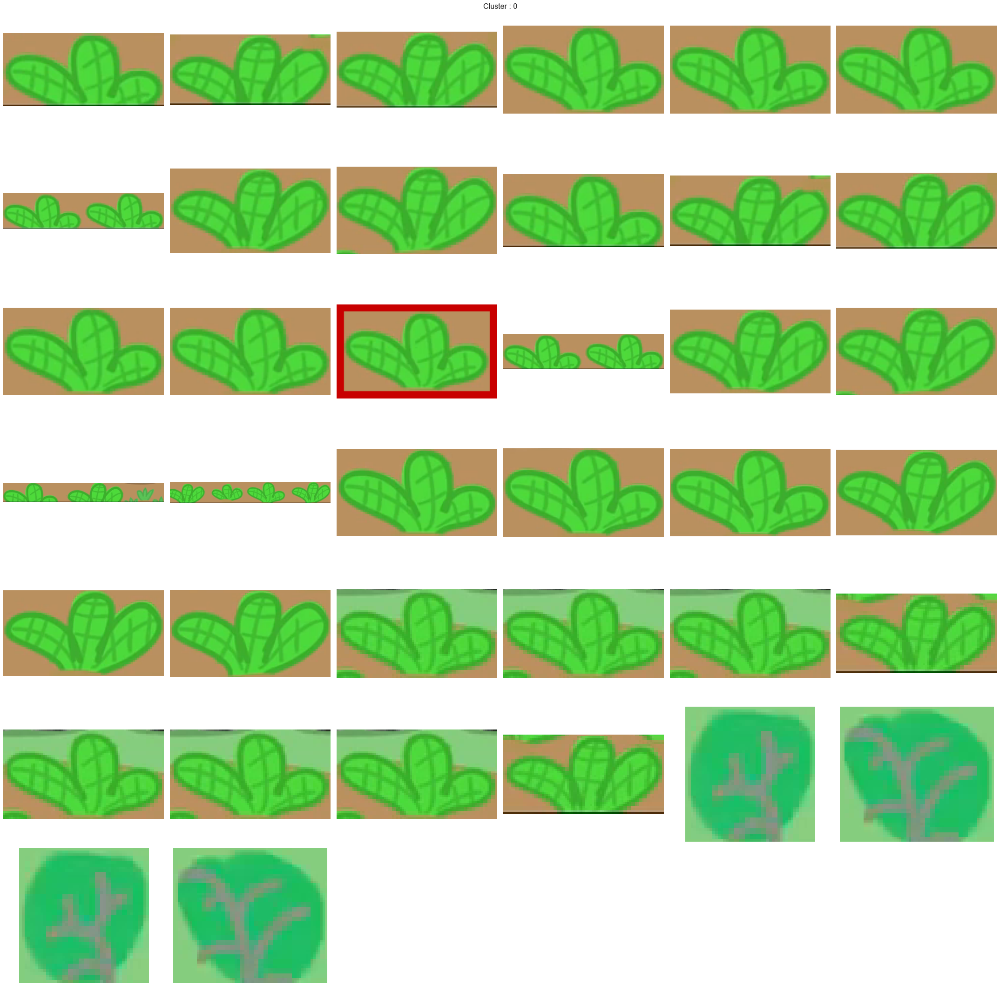

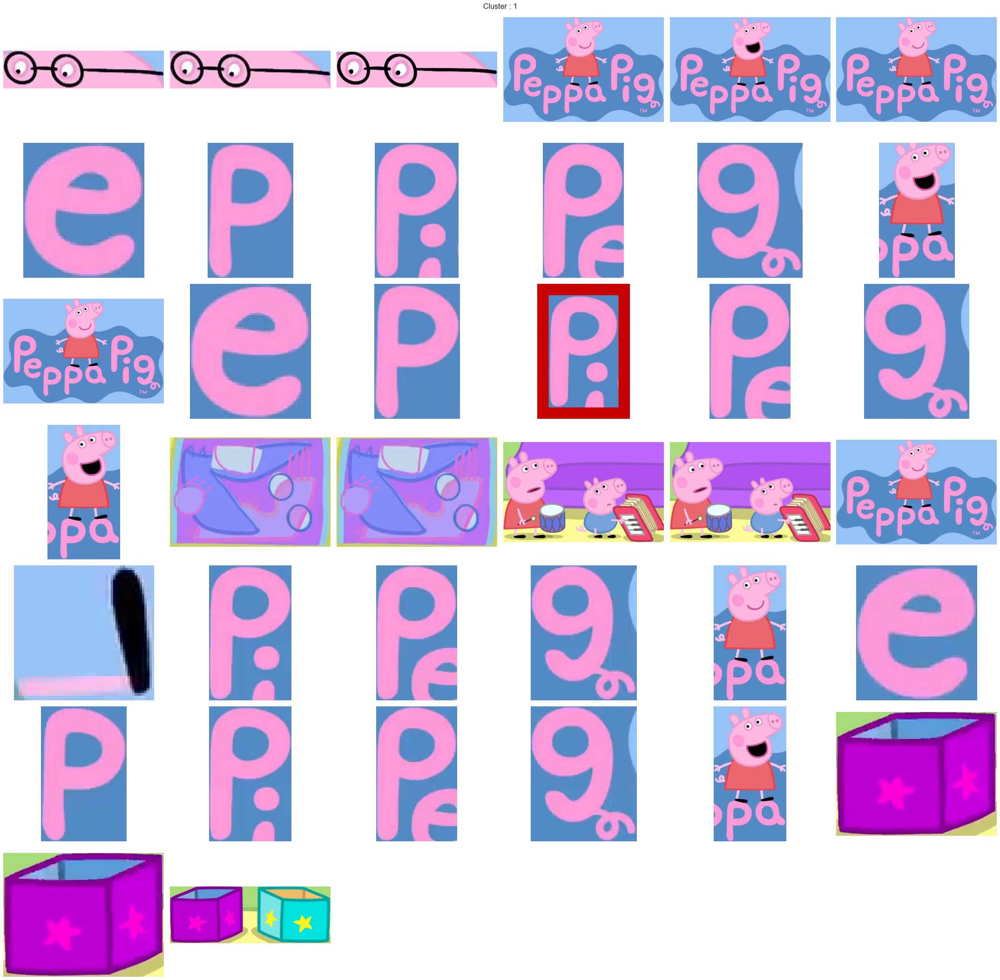

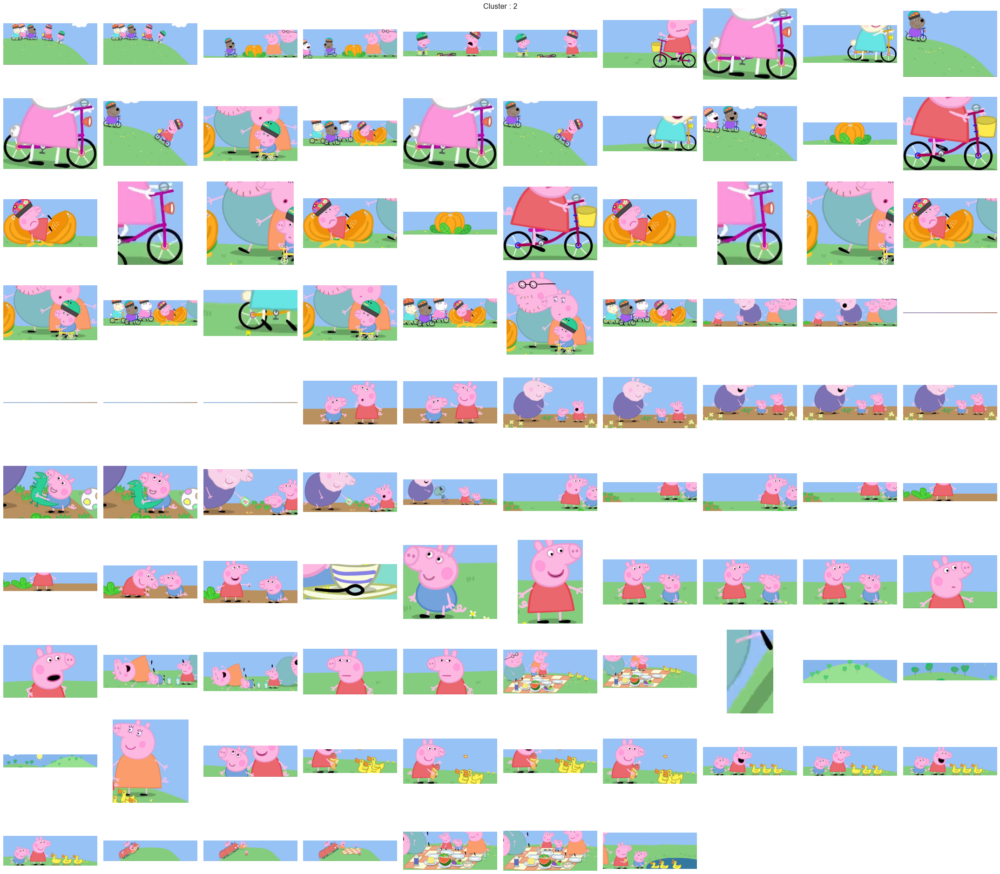

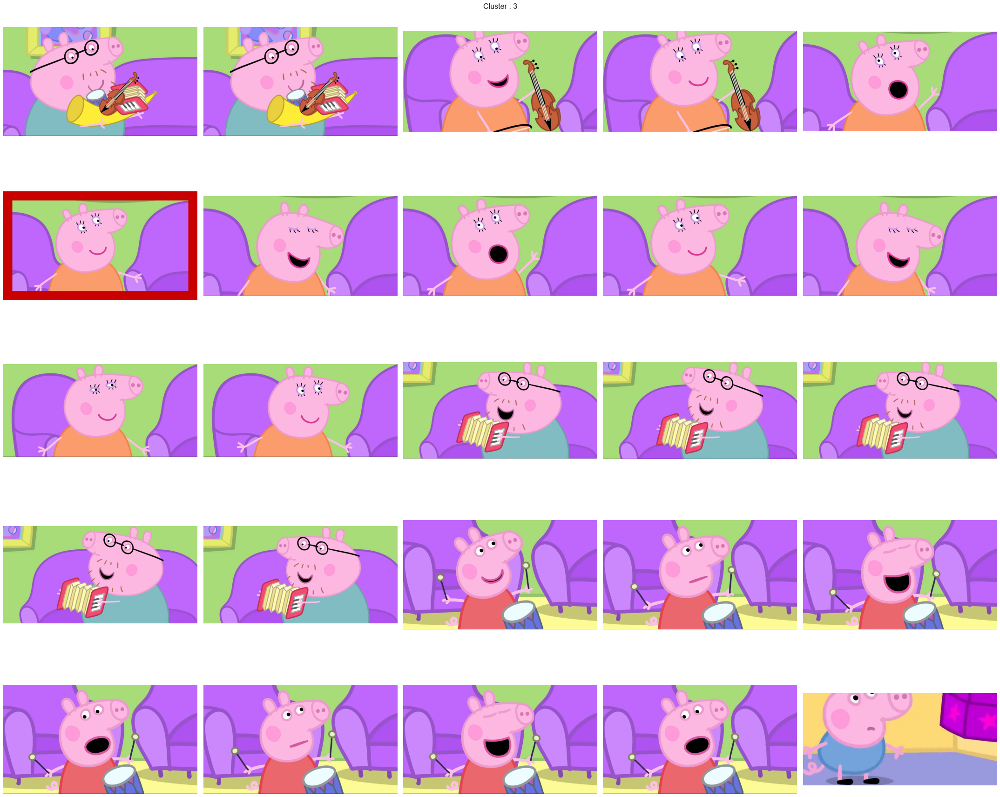

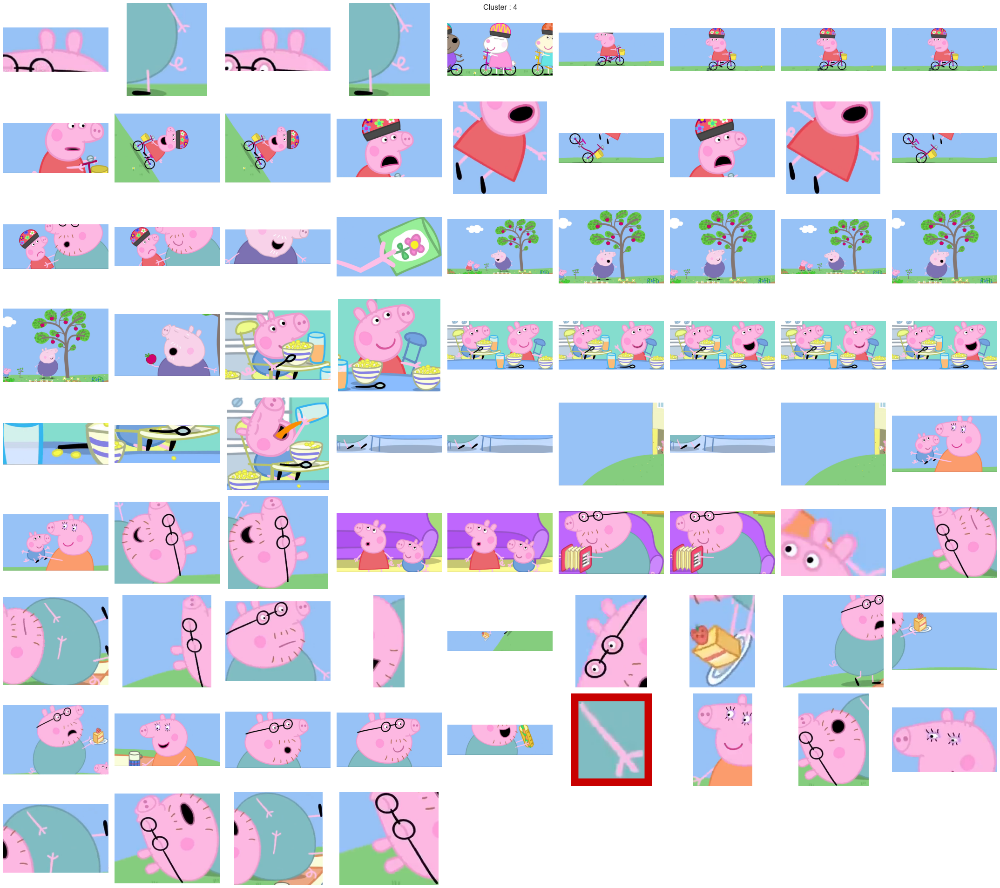

...

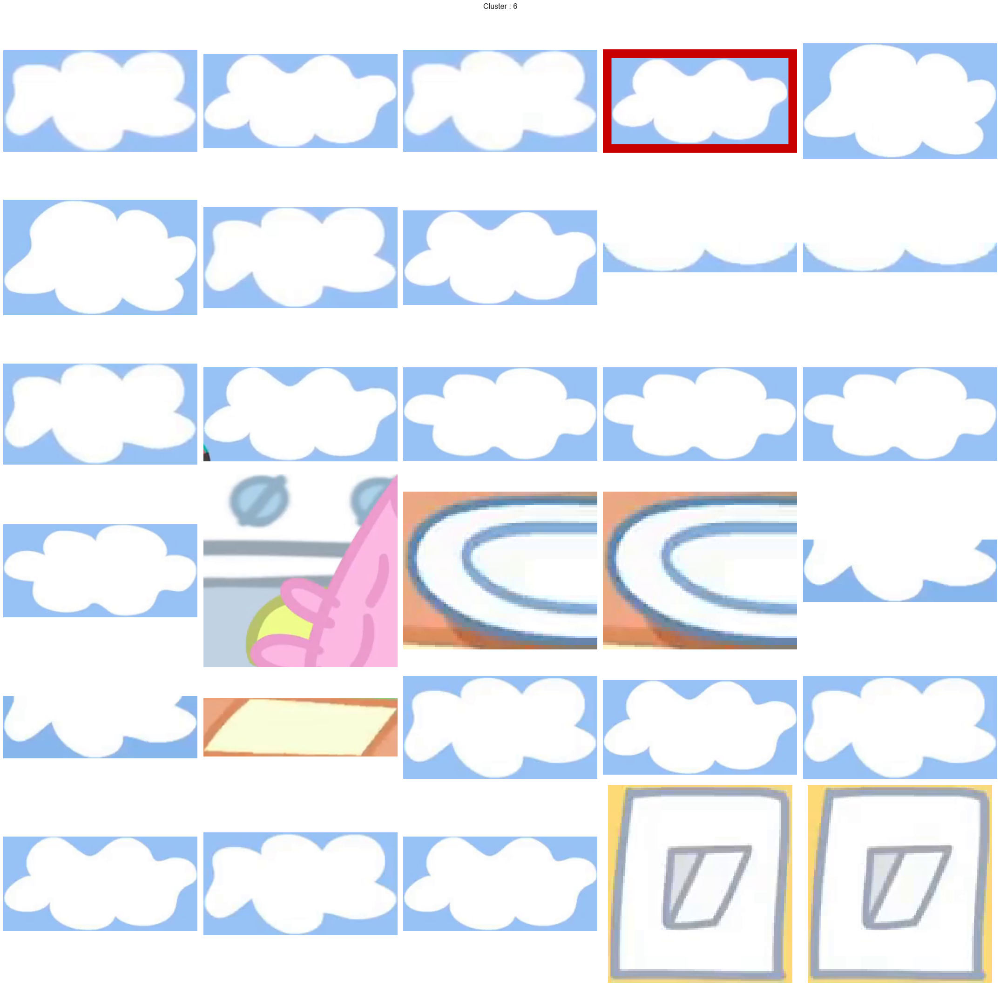

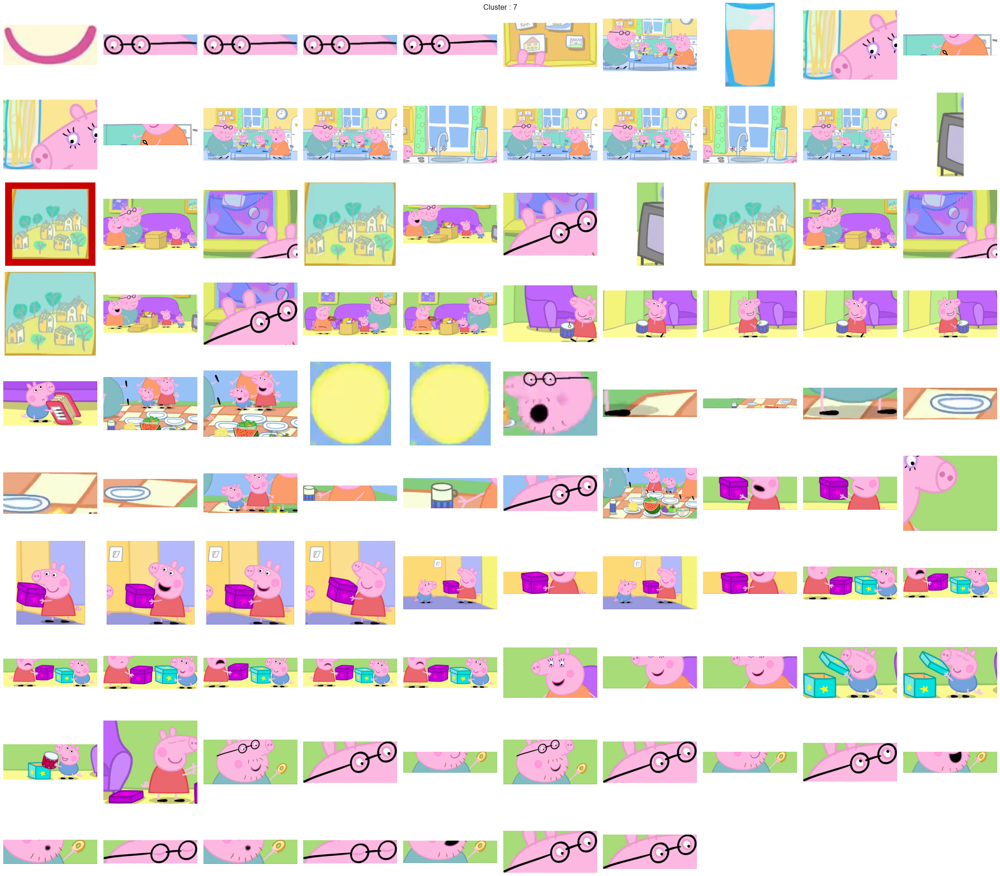

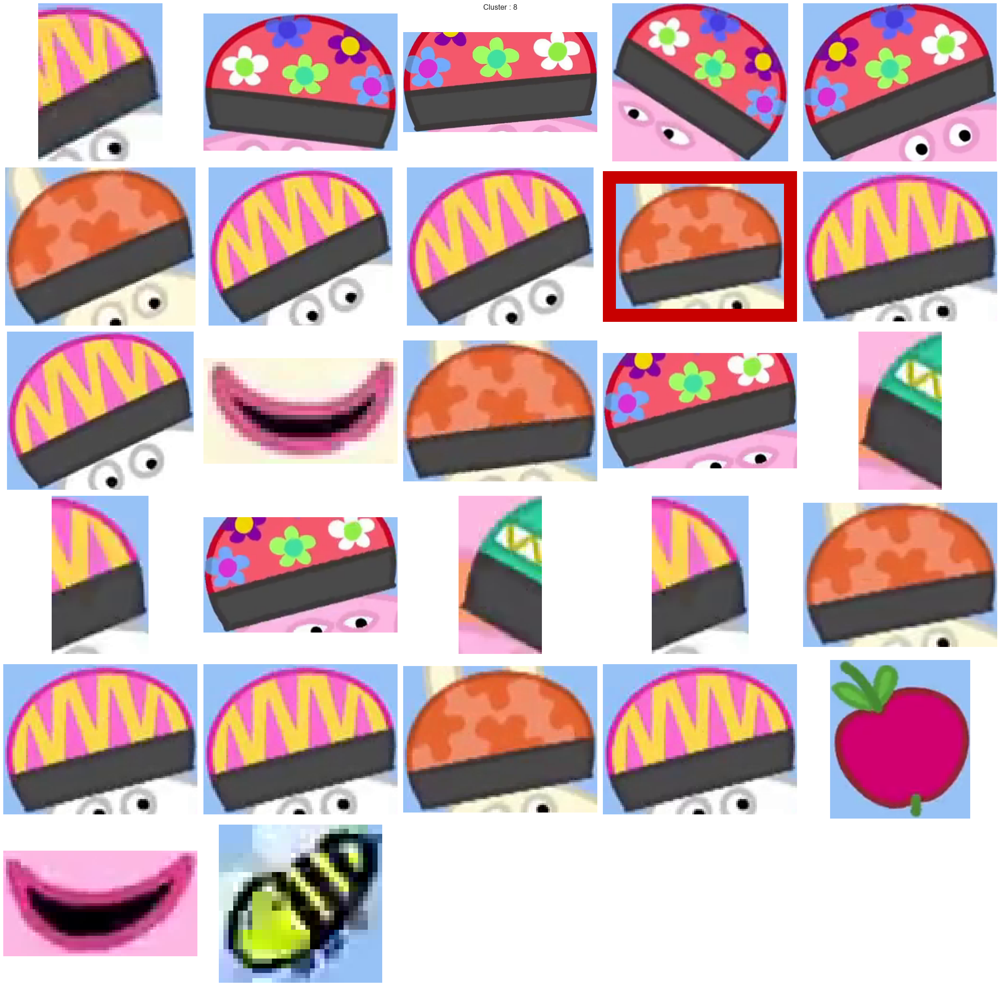

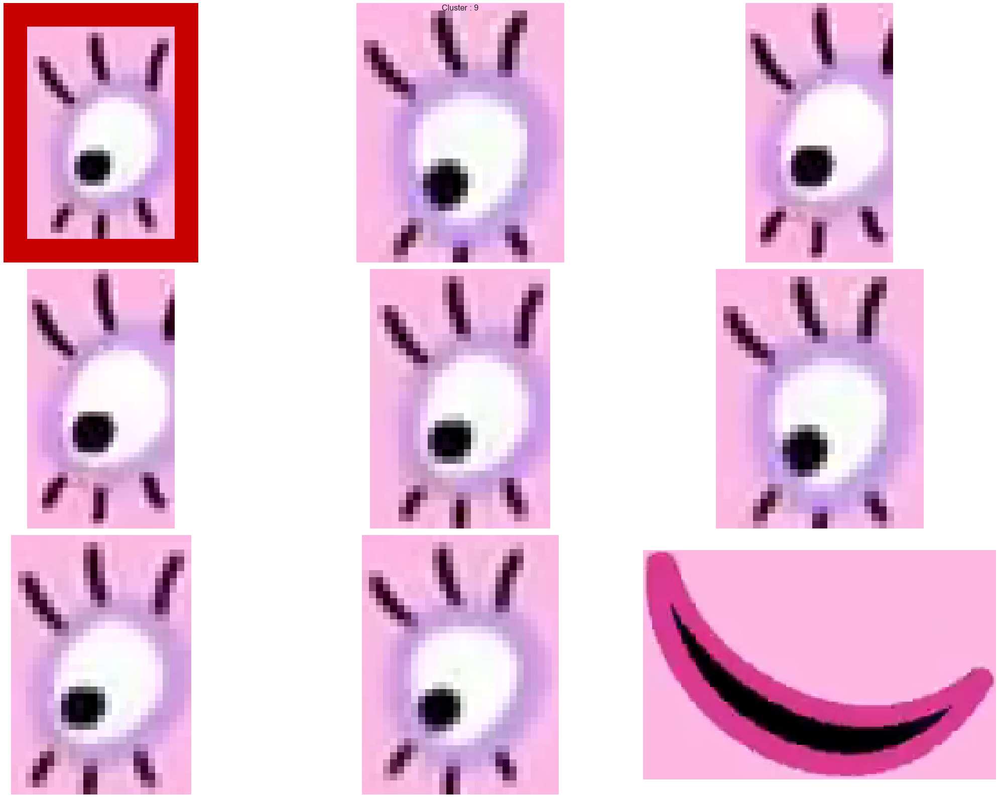

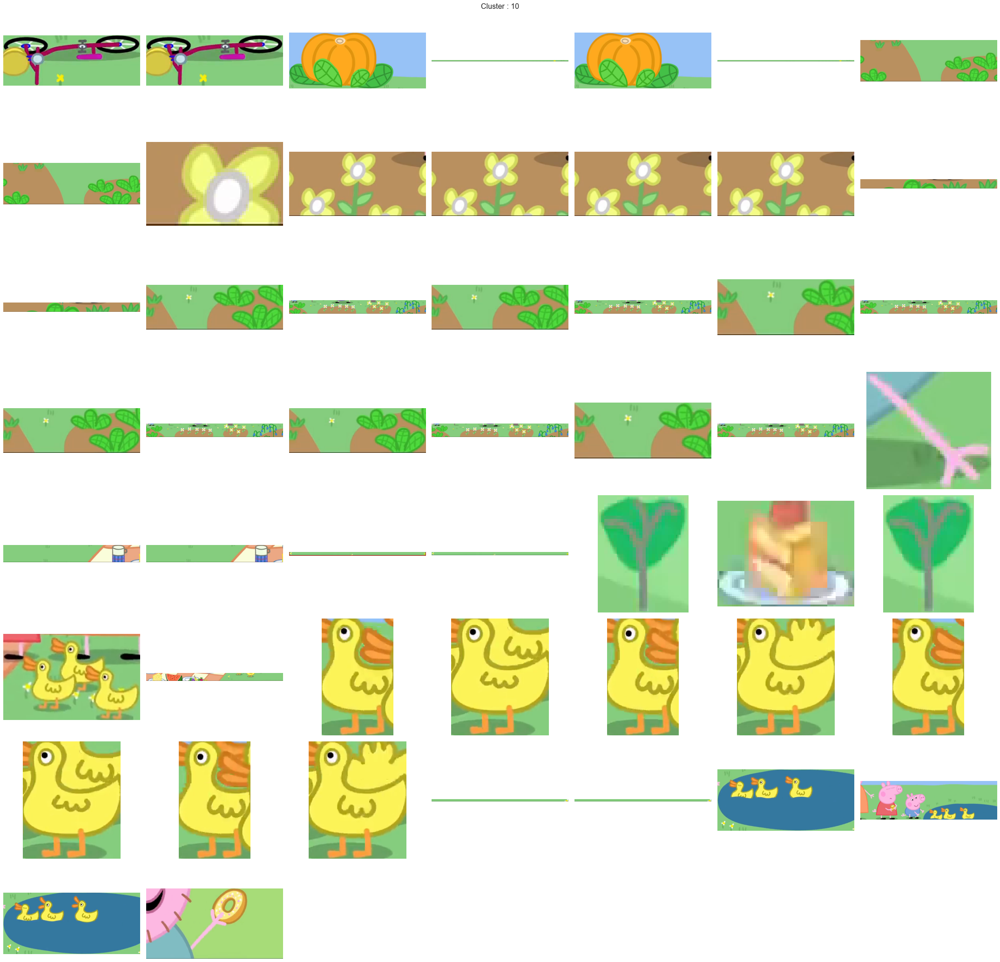

In [76]:
import math
import warnings
warnings.filterwarnings('ignore')

clusters = np.sort(objects.cluster.unique())

for cluster in clusters:
    cl = objects.loc[objects['cluster'] == cluster]
    qty = len(cl)
    x = round(math.sqrt(qty)) +1
    y = x-1
#     figsize=(30, 30)
    fig = plt.figure(figsize=(30, 30))
#     fig.title("Cluster : {}".format(cluster))
    fig.add_subplot(x,y,1)
    fig.suptitle('Cluster : {}'.format(cluster), fontsize=16)
    i = 0
    for index, row in cl.iterrows():
        
        fig.add_subplot(x,y,i+1)
        
        img = cv2.imread(row.path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        if(row.centroid == 1):
            img = cv2.imread(row.path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img_witdh = img.shape[0]
            img_height = img.shape[1] 
            border_size = round(img_witdh*0.1)
            img = cv2.copyMakeBorder(
                 img, border_size, border_size, border_size, border_size, 
                 cv2.BORDER_CONSTANT, 
                 value=[200,0,0]
              )

        else:
            img = cv2.imread(row.path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.axis('off')
        plt.tight_layout()
        plt.imshow(img)
        i+=1
#         axarr[index%x].imshow(img)
#         plt.subplot(x,y,1)
#         plt.imshow(img)
#         plt.title('Hor'), plt.xticks([]), plt.yticks([])
#     print(qty,x,y)
    
    
    

In [52]:
doc_topic = pd.read_csv('D:\ETS\BAC\PFE\LOG795\ILS-SUMM-master\data\csv\doc_topic_dist.csv', index_col=0, dtype=float)

In [53]:
best_topic_from_doc = doc_topic.idxmax(axis=1)

In [54]:
doc_topic = pd.DataFrame({'doc_id':best_topic_from_doc.index.astype(np.int),'topic_id':best_topic_from_doc.values})

In [55]:
doc_topic.head()

,doc_id,topic_id
0,0,1
1,1,2
2,2,3
3,3,1
4,4,3


In [56]:
topic_terms = pd.read_csv('D:\ETS\BAC\PFE\LOG795\ILS-SUMM-master\data\csv\\topic_terms_dist.csv', index_col=0, dtype=float)

In [163]:
nb_terms_max = 10
best_terms_from_topics = topic_terms.apply(lambda s: s.abs().nlargest(nb_terms_max).index.tolist(), axis=1)

TypeError: bad operand type for abs(): 'str'

In [63]:
best_terms_from_topics = pd.DataFrame(data=best_terms_from_topics)

In [73]:
best_terms_from_topics.to_csv('D:\ETS\BAC\PFE\LOG795\ILS-SUMM-master\data\csv\\best_terms_from_topics.csv')

In [149]:
best_terms_from_topics.head()

,0
1.0,"[george, box, daddy, inside, like, little, din..."
2.0,"[george, pepper, stabilizer, daddy, quickly, p..."
3.0,"[grandpa, mummy, daddy, george, plant, strawbe..."
4.0,"[pumpkin, daddy, george, secret, pepper, going..."
5.0,"[play, george, box, mummy, time, duck, good, h..."


In [233]:
topic_terms = pd.DataFrame({'topic_id':best_terms_from_topics.index.astype(np.int),'terms':best_terms_from_topics.values})

In [234]:
topic_terms = topic_terms.assign(topic_id=topic_terms.topic_id).explode('terms')
topic_terms.head()

,topic_id,terms
0,1,george
0,1,box
0,1,daddy
0,1,inside
0,1,like


In [235]:
len(topic_terms.terms.unique())

42

In [236]:
doc_topic.topic_id = doc_topic.topic_id.astype(np.int)
topic_terms.topic_id = topic_terms.topic_id.astype(np.int)
doc_topic_terms = doc_topic.merge(topic_terms, left_on='topic_id',right_on='topic_id')
doc_topic_terms.head()

,doc_id,topic_id,terms
0,0,1,george
1,0,1,box
2,0,1,daddy
3,0,1,inside
4,0,1,like


In [237]:
# doc = pd.read_csv('D:\ETS\BAC\PFE\LOG795\ILS-SUMM-master\data\csv\with_pretreatment_span_3_pfe.csv', dtype=str)
# doc = doc.rename(columns={"Unnamed: 0":'doc_id'})
# doc = doc[['doc_id','sentence','title']]
# doc.head(5)

In [238]:
objects.head()

,id,doc_id,frame_id,object,path,cluster,centroid
0,45_0_0,45,0,0,./data/objects_extracted\bicycles\45_0_0.png,6,0
1,45_0_1,45,0,1,./data/objects_extracted\bicycles\45_0_1.png,6,0
2,45_0_2,45,0,2,./data/objects_extracted\bicycles\45_0_2.png,2,0
3,45_1_0,45,1,0,./data/objects_extracted\bicycles\45_1_0.png,6,0
4,45_1_1,45,1,1,./data/objects_extracted\bicycles\45_1_1.png,6,1


In [239]:
doc_id_cluster = objects[['doc_id', 'cluster']]
doc_id_cluster.head()

,doc_id,cluster
0,45,6
1,45,6
2,45,2
3,45,6
4,45,6


In [240]:
doc_topic_terms.doc_id = doc_topic_terms.doc_id.astype(np.int)
doc_id_cluster.doc_id = doc_id_cluster.doc_id.astype(np.int)
doc_topic_terms = doc_topic_terms.merge(doc_id_cluster, left_on='doc_id',right_on='doc_id')

C:\Users\jojim\anaconda3\lib\site-packages\pandas\core\generic.py:5491: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [241]:
doc_topic_terms.head()

,doc_id,topic_id,terms,cluster
0,0,1,george,1
1,0,1,george,1
2,0,1,box,1
3,0,1,box,1
4,0,1,daddy,1


In [242]:
doc_topic_terms.count()

doc_id      4950
topic_id    4950
terms       4950
cluster     4950
dtype: int64

In [243]:
doc_topic_terms.to_csv('D:\ETS\BAC\PFE\LOG795\ILS-SUMM-master\data\csv\\term_object_cluster.csv')

In [244]:
matrice_terms_objet = doc_topic_terms.groupby(['terms','cluster']).size().unstack(fill_value=0)

In [14]:
doc_topic_terms = pd.read_csv('D:\ETS\BAC\PFE\LOG795\ILS-SUMM-master\data\csv\\term_object_cluster.csv', index_col=0)
matrice_topic_objet = doc_topic_terms.groupby(['topic_id','cluster']).size().unstack(fill_value=0)

In [17]:
matrice_topic_objet.head(10)

cluster,0,1,2,3,4,5,6,7,8,9,10
topic_id,,,,,,,,,,,
1,100,110,130,10,120,10,50,360,40,0,120
2,0,70,80,80,150,0,10,50,30,0,30
3,100,20,260,80,210,30,50,130,10,0,200
4,0,150,330,10,180,30,130,210,180,90,80
5,180,30,100,70,60,0,0,170,0,0,60
6,0,0,70,0,40,0,60,50,10,0,20


In [246]:
matrice_topic_objet.head()

cluster,0,1,2,3,4,5,6,7,8,9,10
terms,,,,,,,,,,,
arm,0,0,7,0,4,0,6,5,1,0,2
box,28,29,56,9,36,4,18,74,22,9,26
daddy,20,35,80,18,66,7,24,75,26,9,43
dinosaur,10,11,13,1,12,1,5,36,4,0,12
done,0,0,7,0,4,0,6,5,1,0,2


In [249]:
matrice_topic_objet.head(42)

cluster,0,1,2,3,4,5,6,7,8,9,10
terms,,,,,,,,,,,
arm,0,0,7,0,4,0,6,5,1,0,2
box,28,29,56,9,36,4,18,74,22,9,26
daddy,20,35,80,18,66,7,24,75,26,9,43
dinosaur,10,11,13,1,12,1,5,36,4,0,12
done,0,0,7,0,4,0,6,5,1,0,2
duck,18,3,10,7,6,0,0,17,0,0,6
feed,18,3,10,7,6,0,0,17,0,0,6
george,38,38,97,25,76,7,30,97,27,9,51
going,0,15,33,1,18,3,13,21,18,9,8


In [250]:
# matrice_topic_objet_ones = matrice_topic_objet.where(matrice_topic_objet < 1, 1)
# matrice_topic_objet_ones.head(3)

In [251]:
# matrice_topic_objet_ones

In [185]:
matrice_topic_objet.to_csv('D:\ETS\BAC\PFE\LOG795\ILS-SUMM-master\data\csv\\term_cluster.csv')

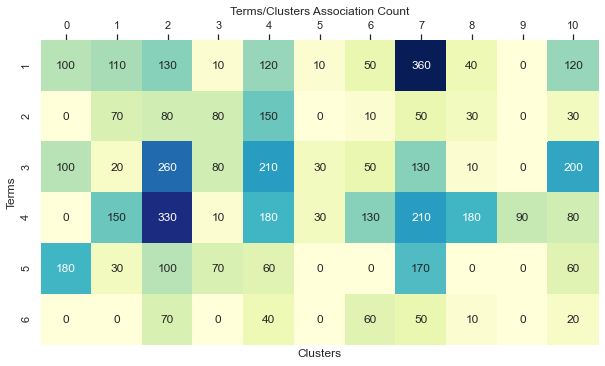

In [18]:
import seaborn as sns; sns.set_theme()

# sns.set(font_scale=2)
fig, ax = plt.subplots(figsize=(10,20)) 
ax = sns.heatmap(matrice_topic_objet,annot=True, cmap="YlGnBu",  fmt='d', cbar=False, square=True)
ax.set(title='Terms/Clusters Association Count',
       xlabel='Clusters',
       ylabel='Terms')
ax.xaxis.set_ticks_position('top')

In [151]:
nombre_lien = matrice_topic_objet.max(axis=1)
best_cluster = matrice_topic_objet.idxmax(axis=1)
topic_cluster = pd.DataFrame({'topic_id':best_cluster.index,'cluster':best_cluster.values,'count':nombre_lien.values})
topic_cluster = topic_cluster.sort_values('count',ascending=False)
topic_cluster.head(50)

,topic_id,cluster,count
0,1,2,400
1,2,2,300
2,3,2,290
3,4,1,180
4,5,2,180
5,6,2,50


In [162]:
best_terms_from_topics

,0
topic_id,
1.0,"[george, box, daddy, inside, like, little, din..."
2.0,"[george, pepper, stabilizer, daddy, quickly, p..."
3.0,"[grandpa, mummy, daddy, george, plant, strawbe..."
4.0,"[pumpkin, daddy, george, secret, pepper, going..."
5.0,"[play, george, box, mummy, time, duck, good, h..."
6.0,"[play, george, picnic, sound, right, like, don..."


In [161]:
top_terms = pd.DataFrame({'topic_id':best_terms_from_topics.index.astype(np.int),'top_terms':best_terms_from_topics[0]})
top_terms.head()

,topic_id,top_terms
topic_id,,
1.0,1,"[george, box, daddy, inside, like, little, din..."
2.0,2,"[george, pepper, stabilizer, daddy, quickly, p..."
3.0,3,"[grandpa, mummy, daddy, george, plant, strawbe..."
4.0,4,"[pumpkin, daddy, george, secret, pepper, going..."
5.0,5,"[play, george, box, mummy, time, duck, good, h..."


In [153]:
topic_cluster = topic_cluster.merge(best_terms_from_topics, left_on='topic_id',right_on='topic_id')

KeyError: 'topic_id'

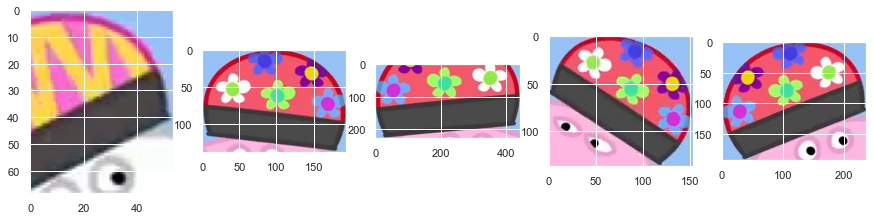

In [72]:
plot_cluster(objects, 8, 5)

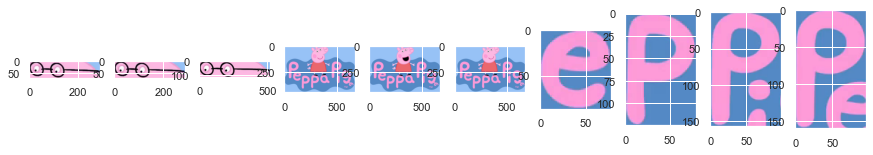

In [66]:
plot_cluster(objects, 1, 10)

In [661]:
i = 2
img = images_flat[i]
centroid = kmeans.cluster_centers_[i]
print(img.shape)
print(centroid.shape)

(3072,)
(3072,)


doc_id                                                2
topic                                              seed
id                                                2_0_1
path       ./data/objects_extracted/gardening/2_0_1.png
cluster                                              30
Name: 566, dtype: object

In [672]:
i = 2
img = images_flat[i]
centroid = kmeans.cluster_centers_[30]
dist = np.linalg.norm(img - centroid)
print(dist)

5931.860885280504


In [674]:
X_dist = kmeans.transform(images_flat)**2

In [677]:
min_dist = []
for i in range(len(images_flat)):
    min_dist.append(np.amin(X_dist[i]))
    
print(min_dist)

[638562.904586047, 1515810.4791662768, 4005325.0135734086, 6734037.017366647, 2111461.832729787, 1647243.3208297936, 6925829.521926343, 1819509.9441358298, 1761371.9100577235, 1090941.9830624016, 5529063.774027168, 5024553.854575992, 6880212.014306396, 4005325.0135734086, 2905117.9433641583, 4005325.0135734086, 638562.904586047, 4173315.6091780667, 8552587.460153967, 11145344.021406323, 7168575.723141818, 1722526.4614595773, 5419094.709394515, 6870500.61829315, 2352403.70858486, 7446288.194195241, 5329363.605806439, 9059497.286506178, 4419809.8259454975, 5544627.869637803, 5332045.615515201, 567238.3989196568, 6093325.225937457, 2628175.1106607616, 1823818.2838895023, 7607084.9084809115, 1512424.1458329484, 5764284.658592821, 3117719.4407579, 1586163.865586355, 2080119.4843987974, 4715233.412715495, 1933912.1262697133, 5376577.16839671, 1922124.0502445698, 2034050.2951267662, 3172328.2660005987, 4306894.147639691, 1619420.81249962, 1960488.6483754518, 4416799.526880086, 1589107.7992372